### USBL DATA PROCESSING

### GRASSMAP 20_09

**Time: 10_41**

Dia 20_09 hora 10:41 -> Survey sparse E_diag. Cola2_nav. USBL no integrat.
Images with full resolution 1920x1440, 2 fps.

Última calibració: Dia 18_09 hora 16:01

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc={'figure.figsize':(25,25)})
sns.set_context("paper")

In [2]:
# This notebook reads csv info extracted from bagfile topics
# To obtain the csvs desired files use usbldata_csv_extractor.py script execute by doing: 
# python usbldata_csv_extractor.py path_to_the_bagfile

# Once the csvs are extracted save them following this structure:
# Desired path + turbot + 
                           #  modem_delayed":"modem_delayed.csv
                           #  modem_raw":"modem_raw.csv
                           #  USBLlon":"USBLlon.csv
                           #  nav_status_turbot":"nav_status_tu.csv
                
# Desired path + xiroi + nav_status_xi.csv           



#Path to folder containing the robot files that contain the csvs
#Change this path and reexecute the notebook to obtain the results from a different bagfile:

path ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/'
path2 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_14'
path3 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_26'
path4 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_31'


# path2='/home/eric/lib/postprocessing_cat/csvs/andratx/21_07/15_09/'

In [3]:
robots=["turbot","xiroi"]

csv_files={"modem_delayed":"modem_delayed.csv",
           "modem_raw":"modem_raw.csv",
           "USBLlon":"USBLlon.csv",
           "nav_status_turbot":"nav_status_tu.csv",
           "xiroi_setpoints":"xiroi_setpoints.csv",
           "nav_status_xiroi":"nav_status_xi.csv"}

#Creates dataframe, sets timestamp as index and resamples to 0.1S (averages data for each 0.1s so that there is only 10 measures for second)
#Resampling allows joining diferent dataframes from different topics
def create_df(csv_file,robot):
    df=pd.read_csv(path+robot+"/"+csv_files[csv_file],header=0,index_col=0)
    original_df=df.copy(deep=False)
    
    df=df.rename(columns={df.columns[0]:"stamp"})
    df['stamp'] = pd.to_datetime(df["stamp"], unit='ns')
    df = df.set_index('stamp')
    df=df.resample('0.1S').mean()
    return original_df,df
    

In [4]:


path ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/'
path2 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_14'
path3 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_26'
path4 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_31'


In [5]:
path ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/'
path2 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_14'
path3 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_26_40'
path4 ='/home/uib/bagfiles/postprocessing_cat/csvs/grassmap/20_09/xiroi/11_31'

#Create topic dataframes:
robot="turbot"
print("---------------------------------------------------------------------------------------------------------------------------------------------------------")
print("TURBOT NAVIGATION")
turbot_nav_status_0,turbot_nav_status=create_df("nav_status_turbot",robot)
display(turbot_nav_status.head())
display(turbot_nav_status.tail())
display(turbot_nav_status.describe())
print("---------------------------------------------------------------------------------------------------------------------------------------------------------")
print("TURBOT USBLLONG")
USBLlon_0,USBLlon_t=create_df("USBLlon",robot)
display(USBLlon_t.head())
display(USBLlon_t.describe())
print("----------------------------------------------------------------------------------------------------------------------------------------------------------")
print("MODEM DELAYED")
modem_delayed_0,modem_delayed=create_df("modem_delayed",robot)
display(modem_delayed.head())
display(modem_delayed.describe())
print("----------------------------------------------------------------------------------------------------------------------------------------------------------")
print("MODEM RAW")
modem_raw_0,modem_raw=create_df("modem_raw",robot)
display(modem_raw.head())
display(modem_raw.describe())
print("----------------------------------------------------------------------------------------------------------------------------------------------------------")

robot="xiroi"
print("XIROI NAVIGATION")
xiroi_nav_status_0,xiroi_nav_status=create_df("nav_status_xiroi",robot)
display(xiroi_nav_status.head())
display(xiroi_nav_status.tail())
display(xiroi_nav_status.describe())
print("---------------------------------------------------------------------------------------------------------------------------------------------------------")

print("XIROI SETPOINTS")
xiroi_setpoints_0,xiroi_setpoints=create_df("xiroi_setpoints",robot)
display(xiroi_setpoints.head())
display(xiroi_setpoints.tail())

display(xiroi_setpoints.describe())
print("---------------------------------------------------------------------------------------------------------------------------------------------------------")

print("XIROI USBLLONG")
USBLlon_0_x,USBLlon=create_df("USBLlon",robot)
display(USBLlon_0_x.head())
USBLlon_0_x.describe()

print("MODEM DELAYED")
modem_delayed_0,modem_delayed=create_df("modem_delayed",robot)
display(modem_delayed.head())
display(modem_delayed.describe())
print("----------------------------------------------------------------------------------------------------------------------------------------------------------")


#XIROI BAGFILE IS DIVIDED IN VARIOUS BAGFILES
#APPEND DATAFRAMES OF ALL XIROI BAGFILES:
path=path2
robot=""
print("XIROI NAVIGATION2")
xiroi_nav_status_02,xiroi_nav_status_2=create_df("nav_status_xiroi",robot)
display(xiroi_nav_status_2.head())
display(xiroi_nav_status_2.tail())
display(xiroi_nav_status_2.describe())

xiroi_nav_status=xiroi_nav_status.append(xiroi_nav_status_2)

display(xiroi_nav_status.head())
display(xiroi_nav_status.tail())
display(xiroi_nav_status.describe())
print("---------------------------------------------------------------------------------------------------------------------------------------------------------")

print("XIROI SETPOINTS2")
xiroi_setpoints_02,xiroi_setpoints2=create_df("xiroi_setpoints",robot)
display(xiroi_setpoints2.head())
display(xiroi_setpoints2.describe())

xiroi_setpoints=xiroi_setpoints.append(xiroi_setpoints2)
display(xiroi_setpoints.head())
display(xiroi_setpoints.tail())
print("---------------------------------------------------------------------------------------------------------------------------------------------------------")

print("XIROI USBLLONG2")
USBLlon_0_2,USBLlon_2=create_df("USBLlon",robot)
display(USBLlon_0_x.head())
USBLlon_0_x.describe()
USBLlon=USBLlon.append(USBLlon_2)

print("MODEM DELAYED2")
modem_delayed_02,modem_delayed_2=create_df("modem_delayed",robot)
display(modem_delayed.head())
display(modem_delayed.describe())
modem_delayed=modem_delayed.append(modem_delayed_2)
print("----------------------------------------------------------------------------------------------------------------------------------------------------------")

#path3
path=path3
robot=""
print("XIROI NAVIGATION3")
xiroi_nav_status_03,xiroi_nav_status_3=create_df("nav_status_xiroi",robot)
xiroi_nav_status=xiroi_nav_status.append(xiroi_nav_status_3)

print("XIROI SETPOINTS3")
xiroi_setpoints_03,xiroi_setpoints3=create_df("xiroi_setpoints",robot)
xiroi_setpoints=xiroi_setpoints.append(xiroi_setpoints3)

print("XIROI USBLLONG3")
USBLlon_0_3,USBLlon_3=create_df("USBLlon",robot)
display(USBLlon_0_x.head())
USBLlon_0_x.describe()
USBLlon=USBLlon.append(USBLlon_3)

print("MODEM DELAYED3")
modem_delayed_03,modem_delayed_3=create_df("modem_delayed",robot)
modem_delayed=modem_delayed.append(modem_delayed_3)

#path4
path=path4
robot=""
print("XIROI NAVIGATION4")
xiroi_nav_status_04,xiroi_nav_status_4=create_df("nav_status_xiroi",robot)
xiroi_nav_status=xiroi_nav_status.append(xiroi_nav_status_4)

display(xiroi_nav_status.head())
display(xiroi_nav_status.tail())

print("XIROI SETPOINTS4")
xiroi_setpoints_04,xiroi_setpoints4=create_df("xiroi_setpoints",robot)
xiroi_setpoints=xiroi_setpoints.append(xiroi_setpoints4)

display(xiroi_setpoints.head())
display(xiroi_setpoints.tail())


print("XIROI USBLLONG4")
USBLlon_0_4,USBLlon_4=create_df("USBLlon",robot)
display(USBLlon_0_x.head())
USBLlon_0_x.describe()
USBLlon=USBLlon.append(USBLlon_4)

display(USBLlon.head())
display(USBLlon.tail())


print("MODEM DELAYED4")
modem_delayed_04,modem_delayed_4=create_df("modem_delayed",robot)
modem_delayed=modem_delayed.append(modem_delayed_4)

display(modem_delayed.head())
display(modem_delayed.tail())



---------------------------------------------------------------------------------------------------------------------------------------------------------
TURBOT NAVIGATION


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 08:42:13.000,0.506199,-33.902916,-159.422529,28.990601,39.1546,2.9449,-0.040683,-0.120349,-0.203954
2021-09-20 08:42:13.100,0.507821,-33.912110,-159.374051,28.993273,39.1546,2.9449,-0.034624,-0.139917,-0.211839
2021-09-20 08:42:13.200,0.495657,-33.915700,-159.288979,28.953911,39.1546,2.9449,-0.018999,-0.155085,-0.219597
2021-09-20 08:42:13.300,0.495107,-33.921633,-159.253229,28.953846,39.1546,2.9449,0.004246,-0.157989,-0.223435
2021-09-20 08:42:13.400,0.496664,-33.864073,-159.228206,28.953776,39.1546,2.9449,0.019548,-0.153864,-0.223712


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 09:53:51.100,0.573524,-49.068677,-114.906882,31.712197,39.1546,2.9449,0.135507,-0.097384,-0.182463
2021-09-20 09:53:51.200,0.571350,-49.070217,-114.897657,31.711325,39.1546,2.9449,0.134705,-0.105343,-0.189485
2021-09-20 09:53:51.300,0.570452,-49.070892,-114.893711,31.709356,39.1546,2.9449,0.132833,-0.106868,-0.190681
2021-09-20 09:53:51.400,0.561237,-49.055996,-114.905627,31.703972,39.1546,2.9449,0.131082,-0.105312,-0.188654
2021-09-20 09:53:51.500,0.559102,-49.052207,-114.905631,31.709902,39.1546,2.9449,0.126642,-0.095342,-0.179838


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
count,42986.000000,42986.000000,42986.000000,42986.000000,42986.0000,4.298600e+04,42986.000000,42986.000000,42986.000000
mean,23.214240,-50.866574,-108.569244,9.682309,39.1546,2.944900e+00,-0.045518,-0.037044,-0.566755
std,11.782016,53.448233,65.756664,11.405599,0.0000,8.881888e-16,0.115181,0.042529,1.788367
min,0.410006,-173.576035,-259.823156,2.820818,39.1546,2.944900e+00,-0.330711,-0.538171,-3.140884
25%,24.653349,-67.728952,-146.212620,3.281640,39.1546,2.944900e+00,-0.122353,-0.047870,-2.407129
50%,27.899069,-53.148673,-110.508008,3.350607,39.1546,2.944900e+00,-0.076105,-0.028565,-0.625567
75%,31.390355,-34.307814,-71.604812,7.927473,39.1546,2.944900e+00,0.000114,-0.014403,0.739760
max,33.996507,73.992220,48.789405,33.854649,39.1546,2.944900e+00,0.413158,0.297106,3.140446


---------------------------------------------------------------------------------------------------------------------------------------------------------
TURBOT USBLLONG


,usbllong_D,usbllong_E,usbllong_N,usbllong_X,usbllong_Y,usbllong_Z,usbllong_pitch,usbllong_roll,usbllong_yaw
stamp,,,,,,,,,
2021-09-20 09:45:04.200,-32.3475,-47.801701,1.9229,42.082901,-23.796499,-31.588301,0.022,-0.0066,-1.0048
2021-09-20 09:45:04.300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:45:04.400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:45:04.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:45:04.600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,usbllong_D,usbllong_E,usbllong_N,usbllong_X,usbllong_Y,usbllong_Z,usbllong_pitch,usbllong_roll,usbllong_yaw
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,-10.266225,-21.576550,-23.351950,-12.786250,-17.704050,-9.923850,0.012275,0.025100,-0.320500
std,14.770456,18.634928,16.849954,36.649567,4.273938,14.457817,0.027448,0.023239,0.483489
min,-32.347500,-47.801701,-31.827000,-34.278400,-23.796499,-31.588301,-0.014100,-0.006600,-1.004800
25%,-11.341050,-28.409025,-31.792574,-30.757525,-19.113575,-10.563775,-0.007425,0.014850,-0.415600
50%,-3.668450,-15.300400,-31.751850,-29.474751,-16.180201,-3.072000,0.008400,0.032100,-0.205350
75%,-2.593625,-8.467925,-23.311226,-11.503475,-14.770675,-2.432075,0.028100,0.042350,-0.110250
max,-1.380500,-7.903700,1.922900,42.082901,-14.659300,-1.963100,0.046400,0.042800,0.133500


----------------------------------------------------------------------------------------------------------------------------------------------------------
MODEM DELAYED


,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
stamp,,,,,,,
2021-09-20 09:45:04.200,-83.311551,-74.055539,-31.5475,0.71098,0.0,0.0,-0.703213
2021-09-20 09:45:04.300,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:45:04.400,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:45:04.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:45:04.600,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
count,4.000000,4.000000,4.000000,4.000000,4.0,4.0,4.000000
mean,-103.017209,-64.405712,-9.466225,0.924797,0.0,0.0,-0.110226
std,13.208256,6.906503,14.770456,0.142551,0.0,0.0,0.395577
min,-111.509665,-74.055539,-31.547500,0.710980,0.0,0.0,-0.703213
25%,-109.486895,-67.066578,-10.541050,0.923414,0.0,0.0,-0.119116
50%,-108.623811,-62.162568,-2.868450,0.995534,0.0,0.0,0.077496
75%,-102.154125,-59.501701,-1.793625,0.996917,0.0,0.0,0.086385
max,-83.311551,-59.242172,-0.580500,0.997139,0.0,0.0,0.107317


----------------------------------------------------------------------------------------------------------------------------------------------------------
MODEM RAW


,modem_raw_X,modem_raw_Y,modem_raw_Z,modem_raw_ori_W,modem_raw_ori_X,modem_raw_ori_Y,modem_raw_ori_Z
stamp,,,,,,,


,modem_raw_X,modem_raw_Y,modem_raw_Z,modem_raw_ori_W,modem_raw_ori_X,modem_raw_ori_Y,modem_raw_ori_Z
count,0,0,0,0,0,0,0
unique,0,0,0,0,0,0,0
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN


----------------------------------------------------------------------------------------------------------------------------------------------------------
XIROI NAVIGATION


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 08:55:49.600,0.0,-130.563123,-85.852012,0.0,39.1546,2.9449,0.0,0.0,-0.088441
2021-09-20 08:55:49.700,0.0,-130.577015,-85.828461,0.0,39.1546,2.9449,0.0,0.0,-0.120449
2021-09-20 08:55:49.800,0.0,-130.599361,-85.787284,0.0,39.1546,2.9449,0.0,0.0,-0.169686
2021-09-20 08:55:49.900,0.0,-130.611185,-85.760428,0.0,39.1546,2.9449,0.0,0.0,-0.158685
2021-09-20 08:55:50.000,0.0,-130.633773,-85.722165,0.0,39.1546,2.9449,0.0,0.0,-0.196628


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 09:12:39.200,0.0,-120.817044,-204.913619,0.0,39.1546,2.9449,0.0,0.0,-2.387537
2021-09-20 09:12:39.300,0.0,-120.820707,-204.925612,0.0,39.1546,2.9449,0.0,0.0,-2.415640
2021-09-20 09:12:39.400,0.0,-120.823541,-204.943060,0.0,39.1546,2.9449,0.0,0.0,-2.411621
2021-09-20 09:12:39.500,0.0,-120.825490,-204.950461,0.0,39.1546,2.9449,0.0,0.0,-2.423996
2021-09-20 09:12:39.600,0.0,-120.827092,-204.969692,0.0,39.1546,2.9449,0.0,0.0,-2.456871


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
count,10101.0,10101.000000,10101.000000,10101.0,10101.0000,1.010100e+04,10101.0,10101.0,10101.000000
mean,0.0,-110.771947,-129.833521,0.0,39.1546,2.944900e+00,0.0,0.0,-0.775158
std,0.0,15.735110,42.915504,0.0,0.0000,8.882224e-16,0.0,0.0,1.833628
min,0.0,-138.047033,-204.969692,0.0,39.1546,2.944900e+00,0.0,0.0,-3.089548
25%,0.0,-120.254419,-166.853197,0.0,39.1546,2.944900e+00,0.0,0.0,-2.423996
50%,0.0,-109.850920,-127.846577,0.0,39.1546,2.944900e+00,0.0,0.0,-1.762335
75%,0.0,-100.276893,-102.445156,0.0,39.1546,2.944900e+00,0.0,0.0,0.617869
max,0.0,-80.567448,-48.565733,0.0,39.1546,2.944900e+00,0.0,0.0,2.874141


---------------------------------------------------------------------------------------------------------------------------------------------------------
XIROI SETPOINTS


,setpoint_0,setpoint_1
stamp,,
2021-09-20 08:55:49.600,0.324515,0.511999
2021-09-20 08:55:49.700,0.396045,0.493582
2021-09-20 08:55:49.800,0.321730,0.468603
2021-09-20 08:55:49.900,0.236609,0.402160
2021-09-20 08:55:50.000,0.288659,0.355783


,setpoint_0,setpoint_1
stamp,,
2021-09-20 09:12:39.200,0.0,0.0
2021-09-20 09:12:39.300,0.0,0.0
2021-09-20 09:12:39.400,0.0,0.0
2021-09-20 09:12:39.500,0.0,0.0
2021-09-20 09:12:39.600,0.0,0.0


,setpoint_0,setpoint_1
count,10101.000000,10101.000000
mean,0.083458,0.107224
std,0.224640,0.297477
min,-0.968340,-0.999792
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.196666,0.260296
max,0.911180,0.911180


---------------------------------------------------------------------------------------------------------------------------------------------------------
XIROI USBLLONG


,a_USBLlong_t,usbllong_D,usbllong_E,usbllong_N,usbllong_X,usbllong_Y,usbllong_Z,usbllong_pitch,usbllong_roll,usbllong_yaw
0,2021-09-20 08:55:51.453739,11.4279,31.831100,-154.328201,-153.533997,-36.529800,7.3406,0.0332,0.0272,-0.4395
1,2021-09-20 08:55:52.513462,12.2069,32.218601,-154.234207,-153.181503,-38.522900,5.1592,0.0403,-0.0229,-0.4512
2,2021-09-20 08:55:56.744480,9.2167,33.104500,-154.241898,-150.379593,-47.528099,9.9242,-0.0002,0.0143,-0.5184
3,2021-09-20 08:55:57.786412,6.2835,33.167500,-154.366501,-154.055298,-33.359402,11.0766,-0.0192,0.0546,-0.4271
4,2021-09-20 08:55:59.401744,10.3511,33.700600,-154.057693,-152.434692,-38.628101,15.7536,-0.0188,0.0648,-0.4677


MODEM DELAYED


,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
stamp,,,,,,,
2021-09-20 08:55:51.400,-238.188502,-168.319271,12.2279,0.999994,0.0,0.0,0.003323
2021-09-20 08:55:51.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.600,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.800,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
count,659.000000,659.000000,659.000000,659.000000,659.0,659.0,659.000000
mean,-95.192698,-160.891180,24.763362,0.485783,0.0,0.0,-0.574252
std,53.998055,33.552809,8.032255,0.252610,0.0,0.0,0.609178
min,-321.280005,-242.552680,-55.131599,0.023728,0.0,0.0,-0.997772
25%,-127.325141,-185.746571,21.936900,0.292887,0.0,0.0,-0.956101
50%,-85.517779,-165.917202,26.285300,0.422848,0.0,0.0,-0.898690
75%,-51.714799,-149.738212,28.774150,0.624600,0.0,0.0,-0.493687
max,-18.897553,22.075092,100.824300,0.999999,0.0,0.0,0.999718


----------------------------------------------------------------------------------------------------------------------------------------------------------
XIROI NAVIGATION2


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 09:14:44.600,0.0,-134.664548,-196.606923,0.0,39.1546,2.9449,0.0,0.0,-0.191651
2021-09-20 09:14:44.700,0.0,-134.679171,-196.582500,0.0,39.1546,2.9449,0.0,0.0,-0.161091
2021-09-20 09:14:44.800,0.0,-134.695186,-196.558058,0.0,39.1546,2.9449,0.0,0.0,-0.153789
2021-09-20 09:14:44.900,0.0,-134.714504,-196.530052,0.0,39.1546,2.9449,0.0,0.0,-0.202999
2021-09-20 09:14:45.000,0.0,-134.737389,-196.503214,0.0,39.1546,2.9449,0.0,0.0,-0.225842


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 09:24:35.100,0.0,-177.102792,-75.404877,0.0,39.1546,2.9449,0.0,0.0,0.362714
2021-09-20 09:24:35.200,0.0,-177.103742,-75.401182,0.0,39.1546,2.9449,0.0,0.0,0.399028
2021-09-20 09:24:35.300,0.0,-177.106083,-75.396901,0.0,39.1546,2.9449,0.0,0.0,0.406055
2021-09-20 09:24:35.400,0.0,-177.106858,-75.393635,0.0,39.1546,2.9449,0.0,0.0,0.387639
2021-09-20 09:24:35.500,0.0,-177.107098,-75.389904,0.0,39.1546,2.9449,0.0,0.0,0.387814


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
count,5910.0,5910.000000,5910.000000,5910.0,5.910000e+03,5.910000e+03,5910.0,5910.0,5910.000000
mean,0.0,-171.092022,-108.300967,0.0,3.915460e+01,2.944900e+00,0.0,0.0,0.307049
std,0.0,12.610104,41.711623,0.0,7.106029e-15,4.441268e-16,0.0,0.0,0.452994
min,0.0,-183.706927,-196.606923,0.0,3.915460e+01,2.944900e+00,0.0,0.0,-0.431166
25%,0.0,-177.129307,-144.376033,0.0,3.915460e+01,2.944900e+00,0.0,0.0,-0.057164
50%,0.0,-176.962661,-81.665073,0.0,3.915460e+01,2.944900e+00,0.0,0.0,0.314109
75%,0.0,-167.228702,-75.341235,0.0,3.915460e+01,2.944900e+00,0.0,0.0,0.470002
max,0.0,-134.664548,-65.225283,0.0,3.915460e+01,2.944900e+00,0.0,0.0,1.626767


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 08:55:49.600,0.0,-130.563123,-85.852012,0.0,39.1546,2.9449,0.0,0.0,-0.088441
2021-09-20 08:55:49.700,0.0,-130.577015,-85.828461,0.0,39.1546,2.9449,0.0,0.0,-0.120449
2021-09-20 08:55:49.800,0.0,-130.599361,-85.787284,0.0,39.1546,2.9449,0.0,0.0,-0.169686
2021-09-20 08:55:49.900,0.0,-130.611185,-85.760428,0.0,39.1546,2.9449,0.0,0.0,-0.158685
2021-09-20 08:55:50.000,0.0,-130.633773,-85.722165,0.0,39.1546,2.9449,0.0,0.0,-0.196628


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 09:24:35.100,0.0,-177.102792,-75.404877,0.0,39.1546,2.9449,0.0,0.0,0.362714
2021-09-20 09:24:35.200,0.0,-177.103742,-75.401182,0.0,39.1546,2.9449,0.0,0.0,0.399028
2021-09-20 09:24:35.300,0.0,-177.106083,-75.396901,0.0,39.1546,2.9449,0.0,0.0,0.406055
2021-09-20 09:24:35.400,0.0,-177.106858,-75.393635,0.0,39.1546,2.9449,0.0,0.0,0.387639
2021-09-20 09:24:35.500,0.0,-177.107098,-75.389904,0.0,39.1546,2.9449,0.0,0.0,0.387814


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
count,16011.0,16011.000000,16011.000000,16011.0,16011.0000,1.601100e+04,16011.0,16011.0,16011.000000
mean,0.0,-133.037367,-121.885399,0.0,39.1546,2.944900e+00,0.0,0.0,-0.375692
std,0.0,32.592041,43.726428,0.0,0.0000,8.882062e-16,0.0,0.0,1.571478
min,0.0,-183.706927,-204.969692,0.0,39.1546,2.944900e+00,0.0,0.0,-3.089548
25%,0.0,-174.787428,-162.620435,0.0,39.1546,2.944900e+00,0.0,0.0,-2.139552
50%,0.0,-120.796901,-113.026576,0.0,39.1546,2.944900e+00,0.0,0.0,0.030494
75%,0.0,-104.158835,-75.511861,0.0,39.1546,2.944900e+00,0.0,0.0,0.494380
max,0.0,-80.567448,-48.565733,0.0,39.1546,2.944900e+00,0.0,0.0,2.874141


---------------------------------------------------------------------------------------------------------------------------------------------------------
XIROI SETPOINTS2


,setpoint_0,setpoint_1
stamp,,
2021-09-20 09:14:44.400,0.357228,0.431652
2021-09-20 09:14:44.500,0.229346,0.433223
2021-09-20 09:14:44.600,0.168939,0.433762
2021-09-20 09:14:44.700,0.185649,0.436919
2021-09-20 09:14:44.800,0.179759,0.338082


,setpoint_0,setpoint_1
count,5912.000000,5912.000000
mean,0.191353,0.273553
std,0.201889,0.209088
min,-0.659426,-0.432429
25%,0.045808,0.170772
50%,0.222108,0.332757
75%,0.343604,0.437080
max,0.576317,0.676781


,setpoint_0,setpoint_1
stamp,,
2021-09-20 08:55:49.600,0.324515,0.511999
2021-09-20 08:55:49.700,0.396045,0.493582
2021-09-20 08:55:49.800,0.321730,0.468603
2021-09-20 08:55:49.900,0.236609,0.402160
2021-09-20 08:55:50.000,0.288659,0.355783


,setpoint_0,setpoint_1
stamp,,
2021-09-20 09:24:35.100,0.169102,-0.149472
2021-09-20 09:24:35.200,0.176033,-0.080893
2021-09-20 09:24:35.300,0.170692,0.246553
2021-09-20 09:24:35.400,-0.125311,0.172182
2021-09-20 09:24:35.500,-0.107044,0.174957


---------------------------------------------------------------------------------------------------------------------------------------------------------
XIROI USBLLONG2


,a_USBLlong_t,usbllong_D,usbllong_E,usbllong_N,usbllong_X,usbllong_Y,usbllong_Z,usbllong_pitch,usbllong_roll,usbllong_yaw
0,2021-09-20 08:55:51.453739,11.4279,31.831100,-154.328201,-153.533997,-36.529800,7.3406,0.0332,0.0272,-0.4395
1,2021-09-20 08:55:52.513462,12.2069,32.218601,-154.234207,-153.181503,-38.522900,5.1592,0.0403,-0.0229,-0.4512
2,2021-09-20 08:55:56.744480,9.2167,33.104500,-154.241898,-150.379593,-47.528099,9.9242,-0.0002,0.0143,-0.5184
3,2021-09-20 08:55:57.786412,6.2835,33.167500,-154.366501,-154.055298,-33.359402,11.0766,-0.0192,0.0546,-0.4271
4,2021-09-20 08:55:59.401744,10.3511,33.700600,-154.057693,-152.434692,-38.628101,15.7536,-0.0188,0.0648,-0.4677


MODEM DELAYED2


,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
stamp,,,,,,,
2021-09-20 08:55:51.400,-238.188502,-168.319271,12.2279,0.999994,0.0,0.0,0.003323
2021-09-20 08:55:51.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.600,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.800,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
count,659.000000,659.000000,659.000000,659.000000,659.0,659.0,659.000000
mean,-95.192698,-160.891180,24.763362,0.485783,0.0,0.0,-0.574252
std,53.998055,33.552809,8.032255,0.252610,0.0,0.0,0.609178
min,-321.280005,-242.552680,-55.131599,0.023728,0.0,0.0,-0.997772
25%,-127.325141,-185.746571,21.936900,0.292887,0.0,0.0,-0.956101
50%,-85.517779,-165.917202,26.285300,0.422848,0.0,0.0,-0.898690
75%,-51.714799,-149.738212,28.774150,0.624600,0.0,0.0,-0.493687
max,-18.897553,22.075092,100.824300,0.999999,0.0,0.0,0.999718


----------------------------------------------------------------------------------------------------------------------------------------------------------
XIROI NAVIGATION3
XIROI SETPOINTS3
XIROI USBLLONG3


,a_USBLlong_t,usbllong_D,usbllong_E,usbllong_N,usbllong_X,usbllong_Y,usbllong_Z,usbllong_pitch,usbllong_roll,usbllong_yaw
0,2021-09-20 08:55:51.453739,11.4279,31.831100,-154.328201,-153.533997,-36.529800,7.3406,0.0332,0.0272,-0.4395
1,2021-09-20 08:55:52.513462,12.2069,32.218601,-154.234207,-153.181503,-38.522900,5.1592,0.0403,-0.0229,-0.4512
2,2021-09-20 08:55:56.744480,9.2167,33.104500,-154.241898,-150.379593,-47.528099,9.9242,-0.0002,0.0143,-0.5184
3,2021-09-20 08:55:57.786412,6.2835,33.167500,-154.366501,-154.055298,-33.359402,11.0766,-0.0192,0.0546,-0.4271
4,2021-09-20 08:55:59.401744,10.3511,33.700600,-154.057693,-152.434692,-38.628101,15.7536,-0.0188,0.0648,-0.4677


MODEM DELAYED3
XIROI NAVIGATION4


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 08:55:49.600,0.0,-130.563123,-85.852012,0.0,39.1546,2.9449,0.0,0.0,-0.088441
2021-09-20 08:55:49.700,0.0,-130.577015,-85.828461,0.0,39.1546,2.9449,0.0,0.0,-0.120449
2021-09-20 08:55:49.800,0.0,-130.599361,-85.787284,0.0,39.1546,2.9449,0.0,0.0,-0.169686
2021-09-20 08:55:49.900,0.0,-130.611185,-85.760428,0.0,39.1546,2.9449,0.0,0.0,-0.158685
2021-09-20 08:55:50.000,0.0,-130.633773,-85.722165,0.0,39.1546,2.9449,0.0,0.0,-0.196628


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 09:56:43.200,0.0,39.825110,-40.194292,0.0,39.1546,2.9449,0.0,0.0,-2.710737
2021-09-20 09:56:43.300,0.0,39.843476,-40.199761,0.0,39.1546,2.9449,0.0,0.0,-2.732889
2021-09-20 09:56:43.400,0.0,39.860291,-40.207929,0.0,39.1546,2.9449,0.0,0.0,-2.780557
2021-09-20 09:56:43.500,0.0,39.885759,-40.215582,0.0,39.1546,2.9449,0.0,0.0,-2.796184
2021-09-20 09:56:43.600,0.0,39.902748,-40.220467,0.0,39.1546,2.9449,0.0,0.0,-2.811537


XIROI SETPOINTS4


,setpoint_0,setpoint_1
stamp,,
2021-09-20 08:55:49.600,0.324515,0.511999
2021-09-20 08:55:49.700,0.396045,0.493582
2021-09-20 08:55:49.800,0.321730,0.468603
2021-09-20 08:55:49.900,0.236609,0.402160
2021-09-20 08:55:50.000,0.288659,0.355783


,setpoint_0,setpoint_1
stamp,,
2021-09-20 09:56:43.200,0.0,0.0
2021-09-20 09:56:43.300,0.0,0.0
2021-09-20 09:56:43.400,0.0,0.0
2021-09-20 09:56:43.500,0.0,0.0
2021-09-20 09:56:43.600,0.0,0.0


XIROI USBLLONG4


,a_USBLlong_t,usbllong_D,usbllong_E,usbllong_N,usbllong_X,usbllong_Y,usbllong_Z,usbllong_pitch,usbllong_roll,usbllong_yaw
0,2021-09-20 08:55:51.453739,11.4279,31.831100,-154.328201,-153.533997,-36.529800,7.3406,0.0332,0.0272,-0.4395
1,2021-09-20 08:55:52.513462,12.2069,32.218601,-154.234207,-153.181503,-38.522900,5.1592,0.0403,-0.0229,-0.4512
2,2021-09-20 08:55:56.744480,9.2167,33.104500,-154.241898,-150.379593,-47.528099,9.9242,-0.0002,0.0143,-0.5184
3,2021-09-20 08:55:57.786412,6.2835,33.167500,-154.366501,-154.055298,-33.359402,11.0766,-0.0192,0.0546,-0.4271
4,2021-09-20 08:55:59.401744,10.3511,33.700600,-154.057693,-152.434692,-38.628101,15.7536,-0.0188,0.0648,-0.4677


,usbllong_D,usbllong_E,usbllong_N,usbllong_X,usbllong_Y,usbllong_Z,usbllong_pitch,usbllong_roll,usbllong_yaw
stamp,,,,,,,,,
2021-09-20 08:55:51.400,11.4279,31.8311,-154.328201,-153.533997,-36.5298,7.3406,0.0332,0.0272,-0.4395
2021-09-20 08:55:51.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,usbllong_D,usbllong_E,usbllong_N,usbllong_X,usbllong_Y,usbllong_Z,usbllong_pitch,usbllong_roll,usbllong_yaw
stamp,,,,,,,,,
2021-09-20 09:50:02.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:50:02.800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:50:02.900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:50:03.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:50:03.100,-4.3389,-7.9037,-31.827,-29.365601,-14.8078,-3.5556,-0.0052,0.0428,-0.2192


MODEM DELAYED4


,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
stamp,,,,,,,
2021-09-20 08:55:51.400,-238.188502,-168.319271,12.2279,0.999994,0.0,0.0,0.003323
2021-09-20 08:55:51.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.600,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 08:55:51.800,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
stamp,,,,,,,
2021-09-20 09:50:02.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:50:02.800,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:50:02.900,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:50:03.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20 09:50:03.100,-108.434983,-59.58821,-3.5389,0.996842,0.0,0.0,0.079408


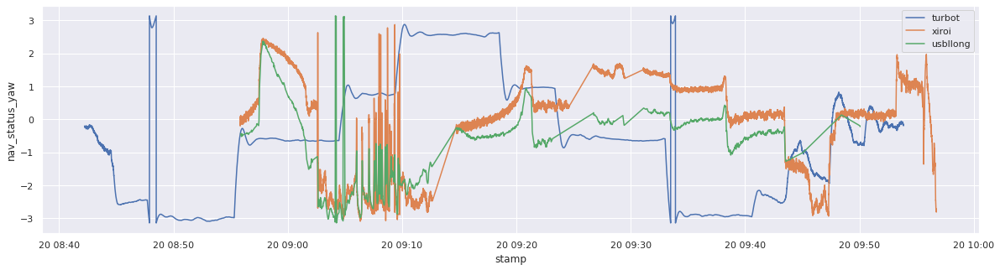

In [6]:
# Plot yaw
sns.set(rc={'figure.figsize':(20,5)})
fig, ax = plt.subplots()
sns.lineplot(data=turbot_nav_status,x="stamp", y="nav_status_yaw",ax=ax)
sns.lineplot(data=xiroi_nav_status,x="stamp", y="nav_status_yaw",ax=ax)
sns.lineplot(data=USBLlon.dropna(),x="stamp", y="usbllong_yaw",ax=ax)
plt.legend(["turbot","xiroi","usbllong"])
plt.show()
# The dataset from the xiroi navigation is shorter than the rest
# There is an offset rotation between the xiroi mag and the usbl mag. Let me unify datasets

In [7]:
display(xiroi_nav_status.head())
display(xiroi_nav_status.tail())
print("-------------------------------")
display(turbot_nav_status.head())
display(turbot_nav_status.tail())

,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 08:55:49.600,0.0,-130.563123,-85.852012,0.0,39.1546,2.9449,0.0,0.0,-0.088441
2021-09-20 08:55:49.700,0.0,-130.577015,-85.828461,0.0,39.1546,2.9449,0.0,0.0,-0.120449
2021-09-20 08:55:49.800,0.0,-130.599361,-85.787284,0.0,39.1546,2.9449,0.0,0.0,-0.169686
2021-09-20 08:55:49.900,0.0,-130.611185,-85.760428,0.0,39.1546,2.9449,0.0,0.0,-0.158685
2021-09-20 08:55:50.000,0.0,-130.633773,-85.722165,0.0,39.1546,2.9449,0.0,0.0,-0.196628


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 09:56:43.200,0.0,39.825110,-40.194292,0.0,39.1546,2.9449,0.0,0.0,-2.710737
2021-09-20 09:56:43.300,0.0,39.843476,-40.199761,0.0,39.1546,2.9449,0.0,0.0,-2.732889
2021-09-20 09:56:43.400,0.0,39.860291,-40.207929,0.0,39.1546,2.9449,0.0,0.0,-2.780557
2021-09-20 09:56:43.500,0.0,39.885759,-40.215582,0.0,39.1546,2.9449,0.0,0.0,-2.796184
2021-09-20 09:56:43.600,0.0,39.902748,-40.220467,0.0,39.1546,2.9449,0.0,0.0,-2.811537


-------------------------------


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 08:42:13.000,0.506199,-33.902916,-159.422529,28.990601,39.1546,2.9449,-0.040683,-0.120349,-0.203954
2021-09-20 08:42:13.100,0.507821,-33.912110,-159.374051,28.993273,39.1546,2.9449,-0.034624,-0.139917,-0.211839
2021-09-20 08:42:13.200,0.495657,-33.915700,-159.288979,28.953911,39.1546,2.9449,-0.018999,-0.155085,-0.219597
2021-09-20 08:42:13.300,0.495107,-33.921633,-159.253229,28.953846,39.1546,2.9449,0.004246,-0.157989,-0.223435
2021-09-20 08:42:13.400,0.496664,-33.864073,-159.228206,28.953776,39.1546,2.9449,0.019548,-0.153864,-0.223712


,nav_status_D,nav_status_E,nav_status_N,nav_status_alt,nav_status_origin_lat,nav_status_origin_lon,nav_status_pitch,nav_status_roll,nav_status_yaw
stamp,,,,,,,,,
2021-09-20 09:53:51.100,0.573524,-49.068677,-114.906882,31.712197,39.1546,2.9449,0.135507,-0.097384,-0.182463
2021-09-20 09:53:51.200,0.571350,-49.070217,-114.897657,31.711325,39.1546,2.9449,0.134705,-0.105343,-0.189485
2021-09-20 09:53:51.300,0.570452,-49.070892,-114.893711,31.709356,39.1546,2.9449,0.132833,-0.106868,-0.190681
2021-09-20 09:53:51.400,0.561237,-49.055996,-114.905627,31.703972,39.1546,2.9449,0.131082,-0.105312,-0.188654
2021-09-20 09:53:51.500,0.559102,-49.052207,-114.905631,31.709902,39.1546,2.9449,0.126642,-0.095342,-0.179838


In [8]:
#Create a unified dataframe:
nav = turbot_nav_status.join(xiroi_nav_status, lsuffix='_turbot', rsuffix='_xiroi').dropna()
display(nav.head())
nav=nav.join(USBLlon).dropna()
nav=nav.join(modem_delayed).dropna()
# nav=nav.join(modem_raw).dropna()
nav.head()

,nav_status_D_turbot,nav_status_E_turbot,nav_status_N_turbot,nav_status_alt_turbot,nav_status_origin_lat_turbot,nav_status_origin_lon_turbot,nav_status_pitch_turbot,nav_status_roll_turbot,nav_status_yaw_turbot,nav_status_D_xiroi,nav_status_E_xiroi,nav_status_N_xiroi,nav_status_alt_xiroi,nav_status_origin_lat_xiroi,nav_status_origin_lon_xiroi,nav_status_pitch_xiroi,nav_status_roll_xiroi,nav_status_yaw_xiroi
stamp,,,,,,,,,,,,,,,,,,
2021-09-20 08:55:49.600,24.711296,-75.279649,-256.085350,3.541385,39.1546,2.9449,-0.003231,-0.020046,-0.463232,0.0,-130.563123,-85.852012,0.0,39.1546,2.9449,0.0,0.0,-0.088441
2021-09-20 08:55:49.700,24.711744,-75.288496,-256.067541,3.541385,39.1546,2.9449,-0.001162,-0.018169,-0.459931,0.0,-130.577015,-85.828461,0.0,39.1546,2.9449,0.0,0.0,-0.120449
2021-09-20 08:55:49.800,24.711841,-75.312810,-256.018118,3.539734,39.1546,2.9449,0.000886,-0.016330,-0.456631,0.0,-130.599361,-85.787284,0.0,39.1546,2.9449,0.0,0.0,-0.169686
2021-09-20 08:55:49.900,24.710126,-75.332849,-255.976210,3.540969,39.1546,2.9449,0.004321,-0.013566,-0.451077,0.0,-130.611185,-85.760428,0.0,39.1546,2.9449,0.0,0.0,-0.158685
2021-09-20 08:55:50.000,24.705329,-75.351924,-255.936373,3.538948,39.1546,2.9449,0.005764,-0.012279,-0.448799,0.0,-130.633773,-85.722165,0.0,39.1546,2.9449,0.0,0.0,-0.196628


,nav_status_D_turbot,nav_status_E_turbot,nav_status_N_turbot,nav_status_alt_turbot,nav_status_origin_lat_turbot,nav_status_origin_lon_turbot,nav_status_pitch_turbot,nav_status_roll_turbot,nav_status_yaw_turbot,nav_status_D_xiroi,...,usbllong_pitch,usbllong_roll,usbllong_yaw,modem_delayed_X,modem_delayed_Y,modem_delayed_Z,modem_delayed_ori_W,modem_delayed_ori_X,modem_delayed_ori_Y,modem_delayed_ori_Z
stamp,,,,,,,,,,,,,,,,,,,,,
2021-09-20 08:55:51.400,24.719359,-75.552937,-255.473490,3.546049,39.1546,2.9449,0.012554,-0.032123,-0.405600,0.0,...,0.0332,0.0272,-0.4395,-238.188502,-168.319271,12.2279,0.999994,0.0,0.0,0.003323
2021-09-20 08:55:52.500,24.719796,-75.718709,-255.064264,3.588041,39.1546,2.9449,0.012781,-0.033472,-0.375195,0.0,...,0.0403,-0.0229,-0.4512,-238.818923,-164.675551,13.0069,0.999878,0.0,0.0,-0.015595
2021-09-20 08:55:56.700,24.775436,-76.183027,-253.597196,3.636026,39.1546,2.9449,-0.029212,-0.009593,-0.299556,0.0,...,-0.0002,0.0143,-0.5184,-234.495405,-175.384033,10.0167,0.999920,0.0,0.0,-0.012658
2021-09-20 08:55:57.700,24.806982,-76.277217,-253.239097,3.649216,39.1546,2.9449,-0.043848,-0.040287,-0.288335,0.0,...,-0.0192,0.0546,-0.4271,-237.027437,-163.387981,7.0835,0.999984,0.0,0.0,-0.005731
2021-09-20 08:55:59.400,24.861003,-76.418971,-252.635796,3.609664,39.1546,2.9449,-0.046288,-0.012766,-0.276144,0.0,...,-0.0188,0.0648,-0.4677,-231.347518,-181.331456,11.1511,0.999380,0.0,0.0,0.035215


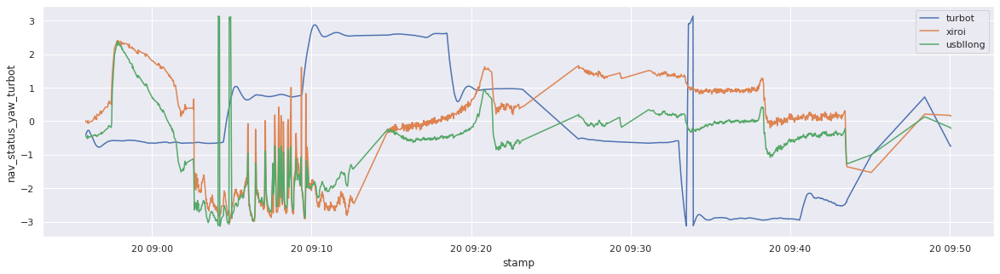

In [9]:
# Plot yaw again
fig, ax = plt.subplots()
sns.lineplot(data=nav,x="stamp", y="nav_status_yaw_turbot",ax=ax)
sns.lineplot(data=nav,x="stamp", y="nav_status_yaw_xiroi",ax=ax)
sns.lineplot(data=nav,x="stamp", y="usbllong_yaw",ax=ax)
plt.legend(["turbot","xiroi","usbllong"])
plt.show()

In [10]:
# Now get the mean yaw difference
yaw_diff = nav.nav_status_yaw_xiroi.mean() - nav.usbllong_yaw.mean()
print(yaw_diff*180/np.pi)

# We will assume that ther is a 90º rotation
nav['usbllong_yaw_corrected'] = nav['usbllong_yaw'] 

31.172996232929695


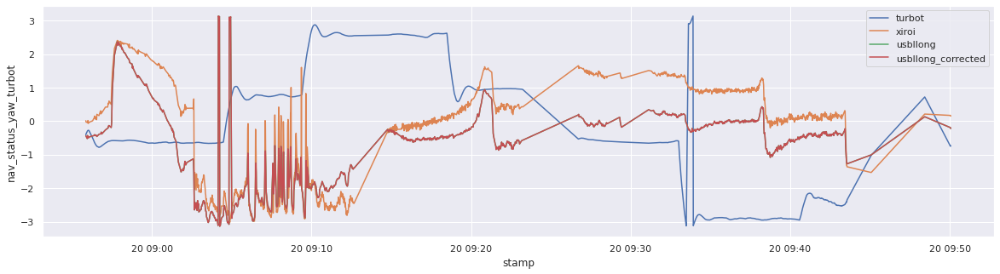

In [11]:
# Plot yaw again!!
fig, ax = plt.subplots()
sns.lineplot(data=nav,x="stamp", y="nav_status_yaw_turbot",ax=ax)
sns.lineplot(data=nav,x="stamp", y="nav_status_yaw_xiroi",ax=ax)
sns.lineplot(data=nav,x="stamp", y="usbllong_yaw",ax=ax)
sns.lineplot(data=nav,x="stamp", y="usbllong_yaw_corrected",ax=ax)
plt.legend(["turbot","xiroi","usbllong", "usbllong_corrected"])
plt.show()
# The differences are due to the use of different calibrations

In [12]:
# Lets transform the USBL measurements, use the following transformation matrix for the rotations
# x' = xcos(yaw) - ysin(yaw)
# y' = xsin(yaw) + cos(yaw)

# 1 - Xiroi + usbllong (mag xiroi)
usbllong_X_transf = nav['usbllong_X']*np.cos(nav["nav_status_yaw_xiroi"])-nav['usbllong_Y']*np.sin(nav["nav_status_yaw_xiroi"])
usbllong_Y_transf = nav['usbllong_X']*np.sin(nav["nav_status_yaw_xiroi"])+nav['usbllong_Y']*np.cos(nav["nav_status_yaw_xiroi"])
nav['p1_N'] = nav['nav_status_N_xiroi'] + usbllong_X_transf
nav['p1_E'] = nav['nav_status_E_xiroi'] + usbllong_Y_transf

# 2 - Xiroi + usbllong (mag usbl) 
usbllong_X_transf = nav['usbllong_X']*np.cos(nav["usbllong_yaw_corrected"])-nav['usbllong_Y']*np.sin(nav["usbllong_yaw_corrected"])
usbllong_Y_transf = nav['usbllong_X']*np.sin(nav["usbllong_yaw_corrected"])+nav['usbllong_Y']*np.cos(nav["usbllong_yaw_corrected"])
nav['p2_N'] = nav['nav_status_N_xiroi']+usbllong_X_transf
nav['p2_E'] = nav['nav_status_E_xiroi']+usbllong_Y_transf

# 2 - Xiroi + usbllong (mag usbl) 
# usbllong_X_transf = nav['usbllong_X']*np.cos(nav["usbllong_yaw_corrected"])-nav['usbllong_Y']*np.sin(nav["usbllong_yaw_corrected"])
# usbllong_Y_transf = nav['usbllong_X']*np.sin(nav["usbllong_yaw_corrected"])+nav['usbllong_Y']*np.cos(nav["usbllong_yaw_corrected"])
nav['p3_N'] = nav['nav_status_N_xiroi']+nav["usbllong_N"]
nav['p3_E'] = nav['nav_status_E_xiroi']+nav["usbllong_E"]


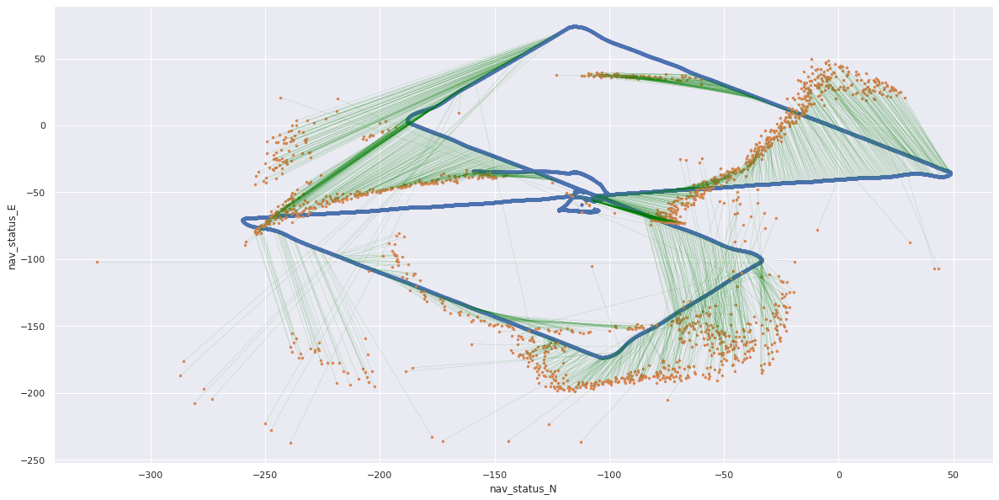

In [13]:
# Plot 
sns.set(rc={'figure.figsize':(20,10)})
fig, ax = plt.subplots()
sns.scatterplot(data=turbot_nav_status,x="nav_status_N", y="nav_status_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
sns.scatterplot(data=nav,x="p1_N", y="p1_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
# sns.scatterplot(data=nav,x="p2_N", y="p2_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)

for index, row in nav.iterrows():
    plt.plot([row.nav_status_N_turbot, row.p1_N], [row.nav_status_E_turbot, row.p1_E], linewidth=0.1, c='green')



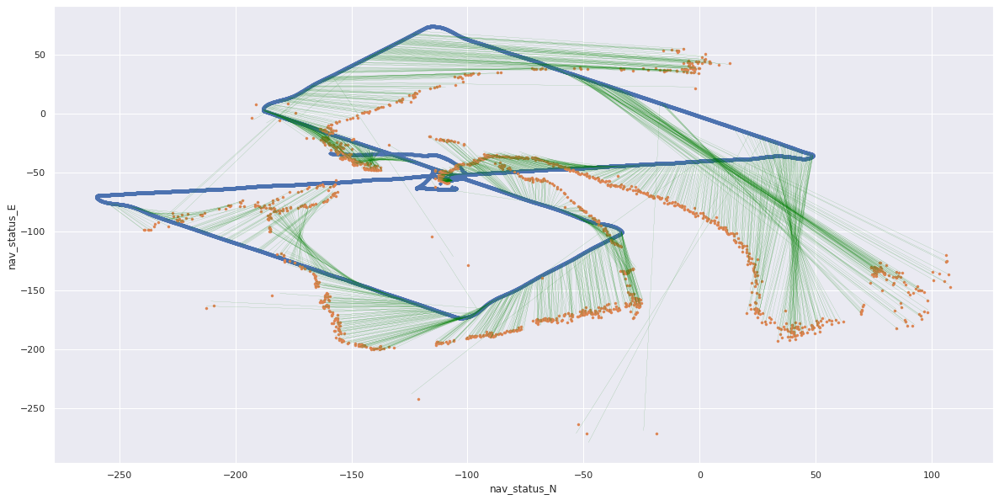

In [14]:
# Plot 
sns.set(rc={'figure.figsize':(20,10)})
fig, ax = plt.subplots()
sns.scatterplot(data=turbot_nav_status,x="nav_status_N", y="nav_status_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
sns.scatterplot(data=nav,x="p3_N", y="p3_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
# sns.scatterplot(data=nav,x="p2_N", y="p2_E", hue=None, style=None, edgecolor=None, s=10, ax=ax,color="red")

for index, row in nav.iterrows():
    plt.plot([row.nav_status_N_turbot, row.p2_N], [row.nav_status_E_turbot, row.p2_E], linewidth=0.1, c='green')

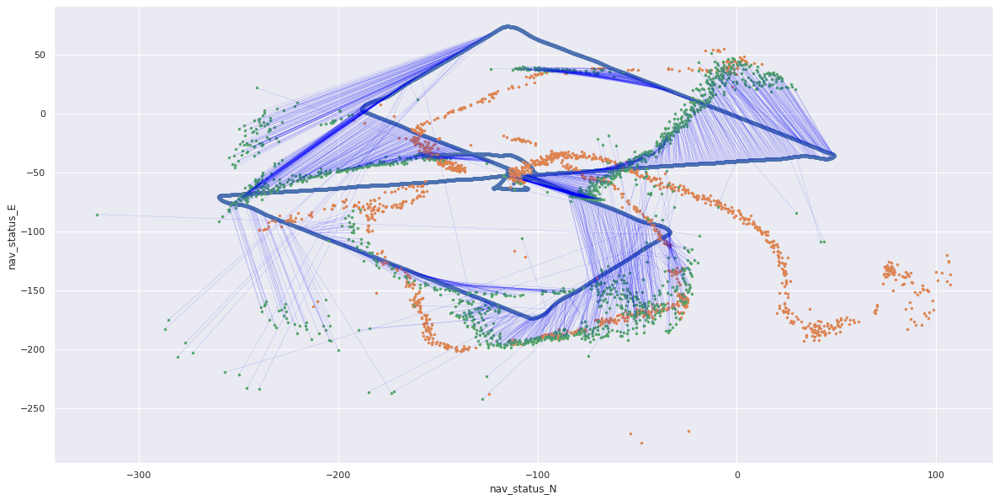

In [15]:
# Plot 
sns.set(rc={'figure.figsize':(20,10)})
fig, ax = plt.subplots()
sns.scatterplot(data=turbot_nav_status,x="nav_status_N", y="nav_status_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
# sns.scatterplot(data=nav,x="p1_N", y="p1_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
sns.scatterplot(data=nav,x="p2_N", y="p2_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
sns.scatterplot(data=modem_delayed,x="modem_delayed_X", y="modem_delayed_Y", hue=None, style=None, edgecolor=None, s=10, ax=ax)

for index, row in nav.iterrows():
    # plt.plot([row.nav_status_N_turbot, row.p1_N], [row.nav_status_E_turbot, row.p1_E], linewidth=0.1, c='orange')
    plt.plot([row.nav_status_N_turbot, row.modem_delayed_X], [row.nav_status_E_turbot, row.modem_delayed_Y], linewidth=0.1, c='blue')

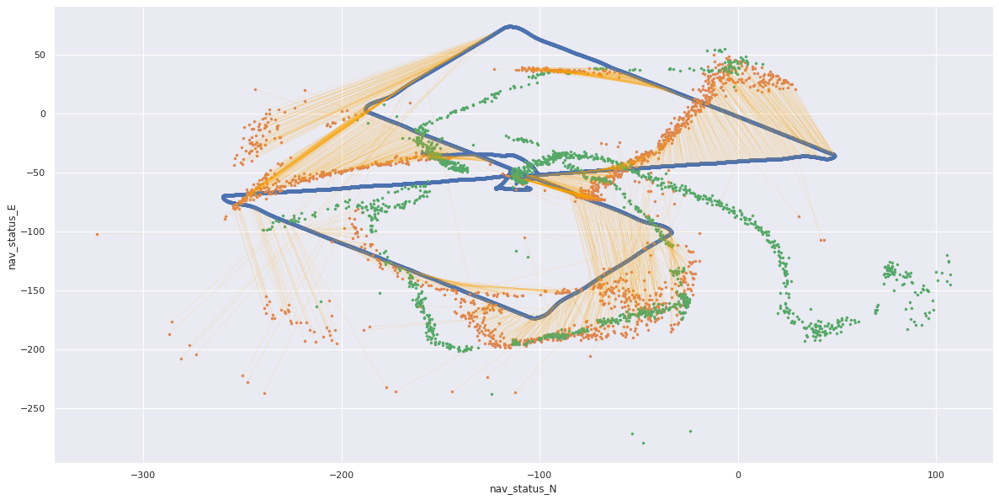

In [16]:
# Plot 
sns.set(rc={'figure.figsize':(20,10)})
fig, ax = plt.subplots()
sns.scatterplot(data=turbot_nav_status,x="nav_status_N", y="nav_status_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
sns.scatterplot(data=nav,x="p1_N", y="p1_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
sns.scatterplot(data=nav,x="p2_N", y="p2_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
# sns.scatterplot(data=modem_delayed,x="modem_delayed_X", y="modem_delayed_Y", hue=None, style=None, edgecolor=None, s=10, ax=ax)

for index, row in nav.iterrows():
    plt.plot([row.nav_status_N_turbot, row.p1_N], [row.nav_status_E_turbot, row.p1_E], linewidth=0.1, c='orange')
    # plt.plot([row.nav_status_N_turbot, row.modem_delayed_X], [row.nav_status_E_turbot, row.modem_delayed_Y], linewidth=0.1, c='blue')
    

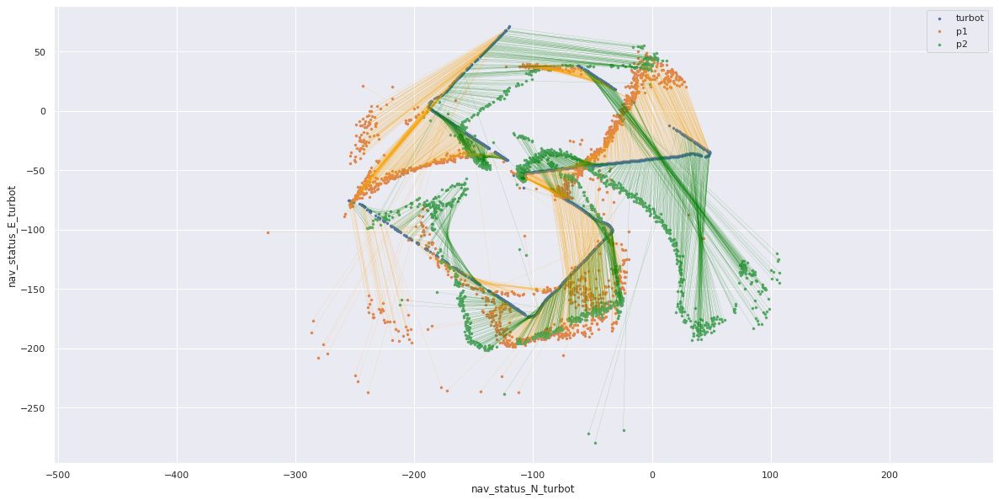

In [17]:
# Plot 
sns.set(rc={'figure.figsize':(20,10)})
fig, ax = plt.subplots()
sns.scatterplot(data=nav,x="nav_status_N_turbot", y="nav_status_E_turbot", hue=None, style=None, edgecolor=None, s=10, ax=ax)
sns.scatterplot(data=nav,x="p1_N", y="p1_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
sns.scatterplot(data=nav,x="p2_N", y="p2_E", hue=None, style=None, edgecolor=None, s=10, ax=ax)
plt.legend(["turbot","p1","p2","modem_raw"])
for index, row in nav.iterrows():
    plt.plot([row.nav_status_N_turbot, row.p1_N], [row.nav_status_E_turbot, row.p1_E], linewidth=0.1, c='orange')
for index, row in nav.iterrows():
    plt.plot([row.nav_status_N_turbot, row.p2_N], [row.nav_status_E_turbot, row.p2_E], linewidth=0.1, c='green')
plt.axis('equal')
plt.show()

In [18]:
# Compute error
N_error_p1 = np.abs(nav['nav_status_N_turbot']-nav['p1_N'])
E_error_p1 = np.abs(nav['nav_status_E_turbot']-nav['p1_E'])
nav['error_p1'] = np.sqrt(np.power(N_error_p1,2)+np.power(E_error_p1,2))

N_error_p2 = np.abs(nav['nav_status_N_turbot']-nav['p2_N'])
E_error_p2 = np.abs(nav['nav_status_E_turbot']-nav['p2_E'])
nav['error_p2'] = np.sqrt(np.power(N_error_p2,2)+np.power(E_error_p2,2))

N_error_p3 = np.abs(nav['nav_status_N_turbot']-nav['p3_N'])
E_error_p3 = np.abs(nav['nav_status_E_turbot']-nav['p3_E'])
nav['error_p3'] = np.sqrt(np.power(N_error_p3,2)+np.power(E_error_p3,2))

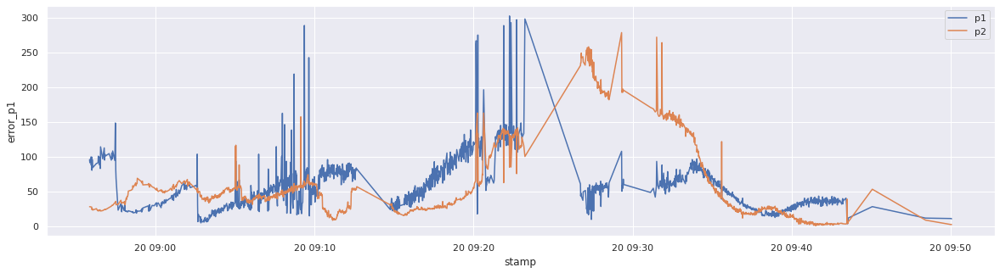

In [19]:
# Plot error 
sns.set(rc={'figure.figsize':(20,5)})
fig, ax = plt.subplots()
sns.lineplot(data=nav,x="stamp", y="error_p1",ax=ax)
sns.lineplot(data=nav,x="stamp", y="error_p2",ax=ax)
plt.legend(["p1","p2"])
plt.show()

In [20]:
# Compute acoustic distance 
E_dist = np.abs(nav['nav_status_E_turbot']-nav['nav_status_E_xiroi'])
N_dist = np.abs(nav['nav_status_N_turbot']-nav['nav_status_N_xiroi'])
D_dist = nav['nav_status_D_turbot']-nav['nav_status_D_xiroi']

nav['dist_2D']=np.sqrt(np.power(E_dist,2)+np.power(N_dist,2))
nav['dist_3D']=np.sqrt(np.power(nav['dist_2D'],2)+np.power(D_dist,2))

In [21]:
nav.head()

,nav_status_D_turbot,nav_status_E_turbot,nav_status_N_turbot,nav_status_alt_turbot,nav_status_origin_lat_turbot,nav_status_origin_lon_turbot,nav_status_pitch_turbot,nav_status_roll_turbot,nav_status_yaw_turbot,nav_status_D_xiroi,...,p1_E,p2_N,p2_E,p3_N,p3_E,error_p1,error_p2,error_p3,dist_2D,dist_3D
stamp,,,,,,,,,,,,,,,,,,,,,
2021-09-20 08:55:51.400,24.719359,-75.552937,-255.473490,3.546049,39.1546,2.9449,0.012554,-0.032123,-0.405600,0.0,...,-169.485425,-239.712581,-98.501757,-239.555006,-98.939209,95.503113,27.839803,28.289854,178.977351,180.676337
2021-09-20 08:55:52.500,24.719796,-75.718709,-255.064264,3.588041,39.1546,2.9449,0.012781,-0.033472,-0.375195,0.0,...,-165.362770,-239.461844,-98.818361,-239.046518,-98.726205,91.077692,27.875247,28.034141,178.985053,180.684027
2021-09-20 08:55:56.700,24.775436,-76.183027,-253.597196,3.636026,39.1546,2.9449,-0.029212,-0.009593,-0.299556,0.0,...,-173.816048,-237.452203,-98.441467,-237.522675,-98.565174,99.340764,27.497253,27.556319,179.126911,180.832167
2021-09-20 08:55:57.700,24.806982,-76.277217,-253.239097,3.649216,39.1546,2.9449,-0.043848,-0.040287,-0.288335,0.0,...,-162.438888,-236.966679,-98.335881,-237.297972,-98.620424,87.578712,27.411244,27.447010,179.126006,180.835595
2021-09-20 08:55:59.400,24.861003,-76.418971,-252.635796,3.609664,39.1546,2.9449,-0.046288,-0.012766,-0.276144,0.0,...,-173.845210,-235.781356,-97.856585,-236.359809,-98.399066,99.208999,27.269827,27.350179,179.203522,180.919794


,nav_status_D_turbot,nav_status_E_turbot,nav_status_N_turbot,nav_status_alt_turbot,nav_status_origin_lat_turbot,nav_status_origin_lon_turbot,nav_status_pitch_turbot,nav_status_roll_turbot,nav_status_yaw_turbot,nav_status_D_xiroi,...,p2_E,p3_N,p3_E,error_p1,error_p2,error_p3,dist_2D,dist_3D,setpoint_0,setpoint_1
stamp,,,,,,,,,,,,,,,,,,,,,
2021-09-20 08:55:51.400,24.719359,-75.552937,-255.473490,3.546049,39.1546,2.9449,0.012554,-0.032123,-0.405600,0.0,...,-98.501757,-239.555006,-98.939209,95.503113,27.839803,28.289854,178.977351,180.676337,0.233134,0.494110
2021-09-20 08:55:52.500,24.719796,-75.718709,-255.064264,3.588041,39.1546,2.9449,0.012781,-0.033472,-0.375195,0.0,...,-98.818361,-239.046518,-98.726205,91.077692,27.875247,28.034141,178.985053,180.684027,0.435027,0.476756
2021-09-20 08:55:56.700,24.775436,-76.183027,-253.597196,3.636026,39.1546,2.9449,-0.029212,-0.009593,-0.299556,0.0,...,-98.441467,-237.522675,-98.565174,99.340764,27.497253,27.556319,179.126911,180.832167,0.450984,0.493798
2021-09-20 08:55:57.700,24.806982,-76.277217,-253.239097,3.649216,39.1546,2.9449,-0.043848,-0.040287,-0.288335,0.0,...,-98.335881,-237.297972,-98.620424,87.578712,27.411244,27.447010,179.126006,180.835595,0.334891,0.519894
2021-09-20 08:55:59.400,24.861003,-76.418971,-252.635796,3.609664,39.1546,2.9449,-0.046288,-0.012766,-0.276144,0.0,...,-97.856585,-236.359809,-98.399066,99.208999,27.269827,27.350179,179.203522,180.919794,0.378047,0.314364


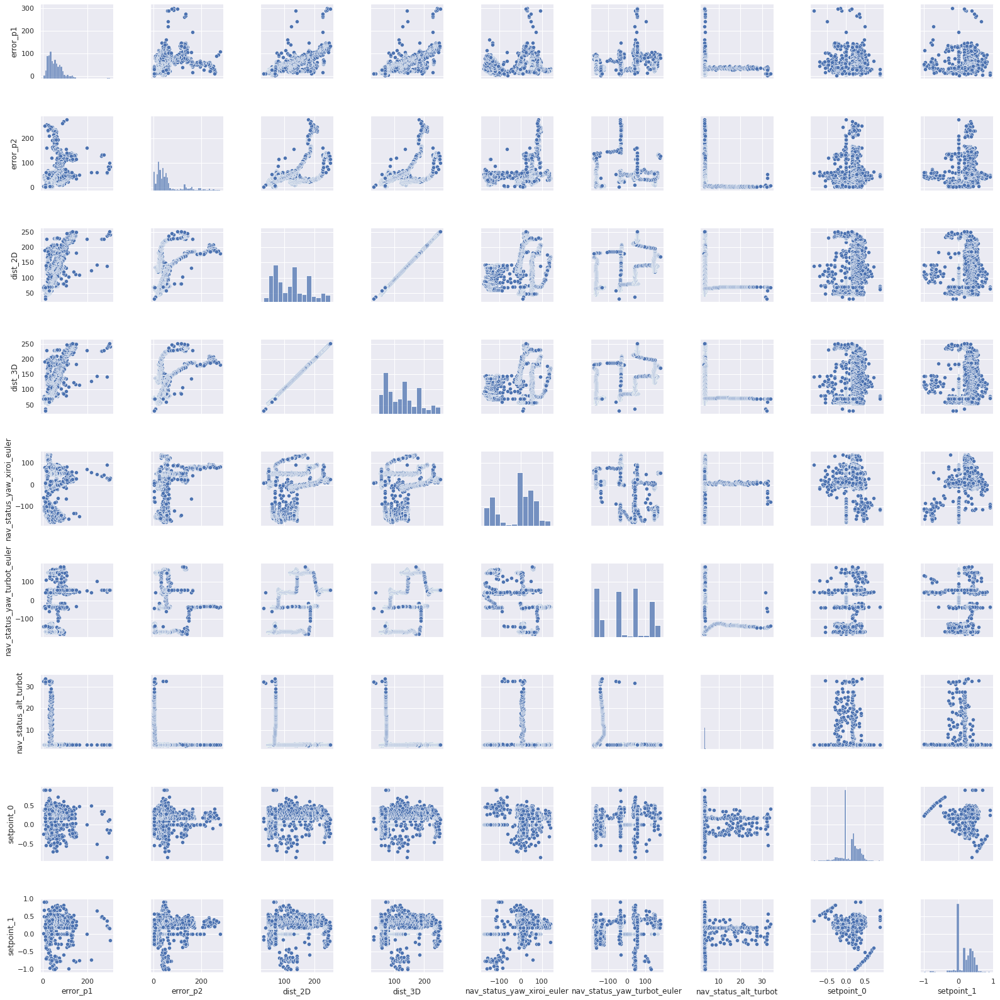

In [22]:
nav=nav.join(xiroi_setpoints).dropna()
# Error correlation with distance and orientation
display(nav.head())
nav['nav_status_yaw_xiroi_euler'] = nav['nav_status_yaw_xiroi'] *180/np.pi 
nav['nav_status_yaw_turbot_euler'] = nav['nav_status_yaw_turbot'] *180/np.pi 
nav_corr=nav[['error_p1','error_p2','dist_2D','dist_3D','nav_status_yaw_xiroi_euler','nav_status_yaw_turbot_euler','nav_status_alt_turbot',"setpoint_0",'setpoint_1']]
sns.pairplot(nav_corr)

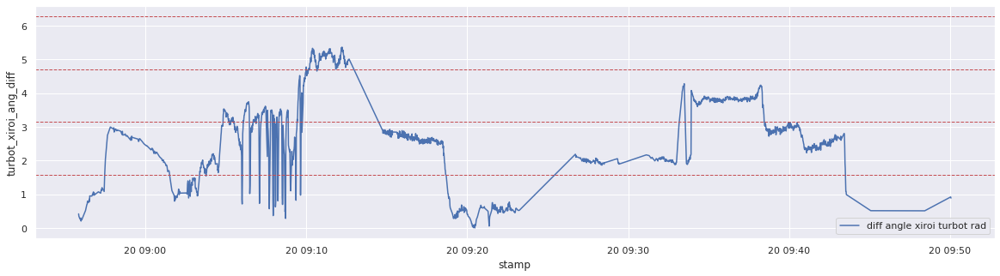

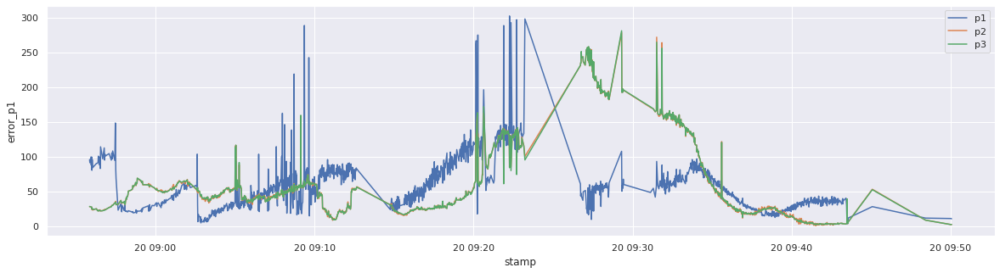

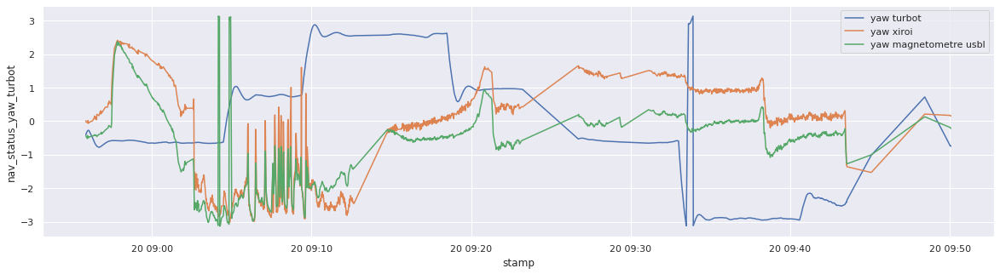

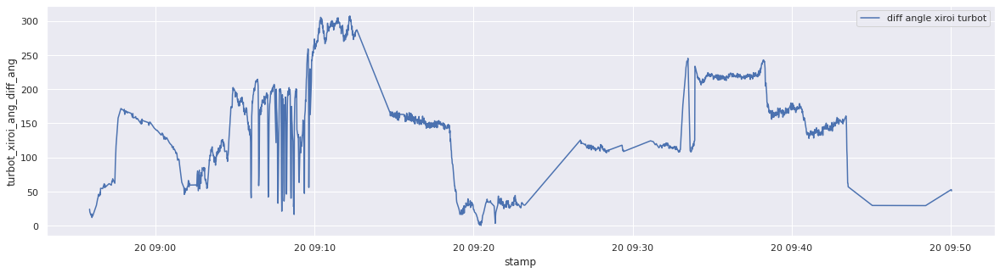

In [23]:
# Plot angle diff
sns.set(rc={'figure.figsize':(20,5)})
fig, ax = plt.subplots()
nav['turbot_xiroi_ang_diff'] = np.abs(nav['nav_status_yaw_turbot']-nav['nav_status_yaw_xiroi'])
sns.lineplot(data=nav,x="stamp", y="turbot_xiroi_ang_diff",ax=ax)
ax.axhline(np.pi/2,linewidth=1, color='r',ls='--')
ax.axhline(np.pi,linewidth=1, color='r',ls='--')
ax.axhline((3/2)*np.pi,linewidth=1, color='r',ls='--')
ax.axhline(2*np.pi,linewidth=1, color='r',ls='--')

plt.legend(["diff angle xiroi turbot rad"])
plt.show()

# Plot error 
sns.set(rc={'figure.figsize':(20,5)})
fig, ax = plt.subplots()
sns.lineplot(data=nav,x="stamp", y="error_p1",ax=ax)
sns.lineplot(data=nav,x="stamp", y="error_p2",ax=ax)
sns.lineplot(data=nav,x="stamp", y="error_p3",ax=ax)
plt.legend(["p1","p2","p3"])
plt.show()

# Plot angle 
sns.set(rc={'figure.figsize':(20,5)})
fig, ax = plt.subplots()
sns.lineplot(data=nav,x="stamp", y="nav_status_yaw_turbot",ax=ax)
sns.lineplot(data=nav,x="stamp", y="nav_status_yaw_xiroi",ax=ax)
sns.lineplot(data=nav,x="stamp", y="usbllong_yaw",ax=ax)
plt.legend(["yaw turbot","yaw xiroi","yaw magnetometre usbl"])
plt.show()

# Plot angle diff deg
sns.set(rc={'figure.figsize':(20,5)})
fig, ax = plt.subplots()
nav['turbot_xiroi_ang_diff_ang'] = nav['turbot_xiroi_ang_diff']*(180/np.pi)
sns.lineplot(data=nav,x="stamp", y="turbot_xiroi_ang_diff_ang",ax=ax)
plt.legend(["diff angle xiroi turbot"])
plt.show()



,error_p1,error_p2,dist_3D,nav_status_yaw_xiroi
count,1738.000000,1738.000000,1738.000000,1738.000000
mean,55.120013,54.794349,126.694180,-0.241133
std,34.881109,53.437210,53.979680,1.442528
min,3.248446,0.880666,31.097700,-3.018258
25%,30.370346,22.333692,74.131418,-1.849366
50%,48.096032,39.129178,123.981310,0.098827
75%,73.130208,58.811547,170.719267,0.912242
max,302.007572,278.139160,253.218827,2.412002


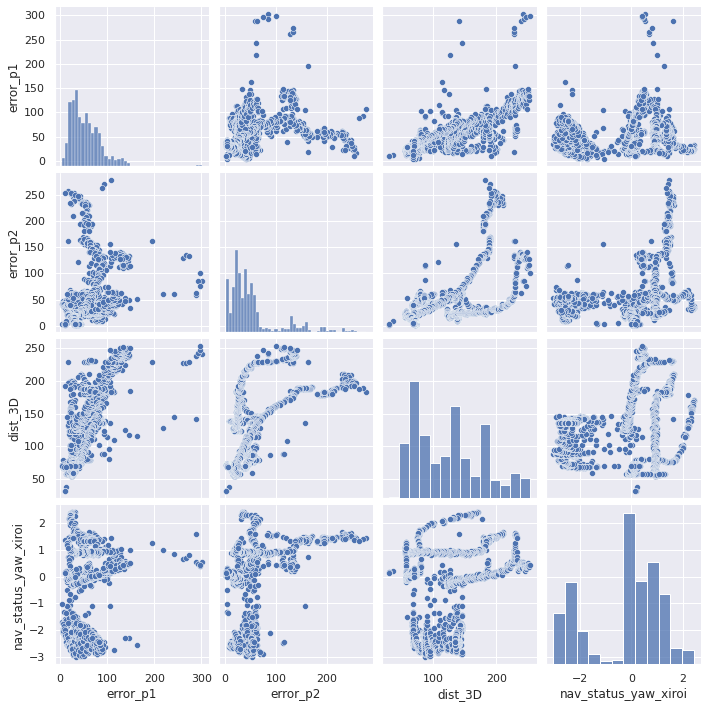

In [24]:
# Error correlation with distance and orientation
nav_corr=nav[['error_p1','error_p2','dist_3D','nav_status_yaw_xiroi']]
sns.pairplot(nav_corr)
# There is a clear correlation between the usbl error and the xiroi orientation, not that evident but important with the distance
display(nav_corr.describe())

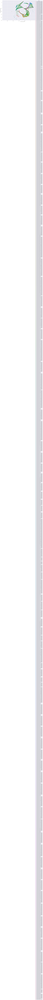

In [25]:

sns.set(rc={'figure.figsize':(20,10)})
fig, ax = plt.subplots()
sns.scatterplot(data=nav,x="nav_status_N_turbot", y="nav_status_E_turbot", hue=None, style=None, edgecolor=None, s=10, ax=ax, color='black')
sns.scatterplot(data=nav,x="p1_N", y="p1_E", hue='stamp', style=None, edgecolor=None, s=30, ax=ax)
# sns.scatterplot(data=nav,x="nav_status_N_xiroi", y="nav_status_E_xiroi", hue='nav_status_yaw_xiroi_euler', style=None, edgecolor=None, s=30, ax=ax, palette='viridis')

for index, row in nav.iterrows():
    plt.plot([row.nav_status_N_turbot, row.p1_N], [row.nav_status_E_turbot, row.p1_E], linewidth=0.2,ls="--", c='green')


plt.axis('equal')

plt.show()

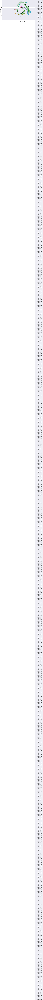

In [26]:
# Lets plot again the localization results, this time color represents the xiroi orientation
sns.set(rc={'figure.figsize':(20,10)})
fig, ax = plt.subplots()
sns.scatterplot(data=nav,x="nav_status_N_turbot", y="nav_status_E_turbot", hue=None, style=None, edgecolor=None, s=10, ax=ax, color='black')
sns.scatterplot(data=nav,x="p2_N", y="p2_E", hue='stamp', style=None, edgecolor=None, s=30, ax=ax)
# sns.scatterplot(data=nav,x="nav_status_N_xiroi", y="nav_status_E_xiroi", hue='nav_status_yaw_xiroi_euler', style=None, edgecolor=None, s=30, ax=ax, palette='viridis')

for index, row in nav.iterrows():
    plt.plot([row.nav_status_N_turbot, row.p2_N], [row.nav_status_E_turbot, row.p2_E], linewidth=0.2,ls="--", c='green')


plt.axis('equal')

plt.show()

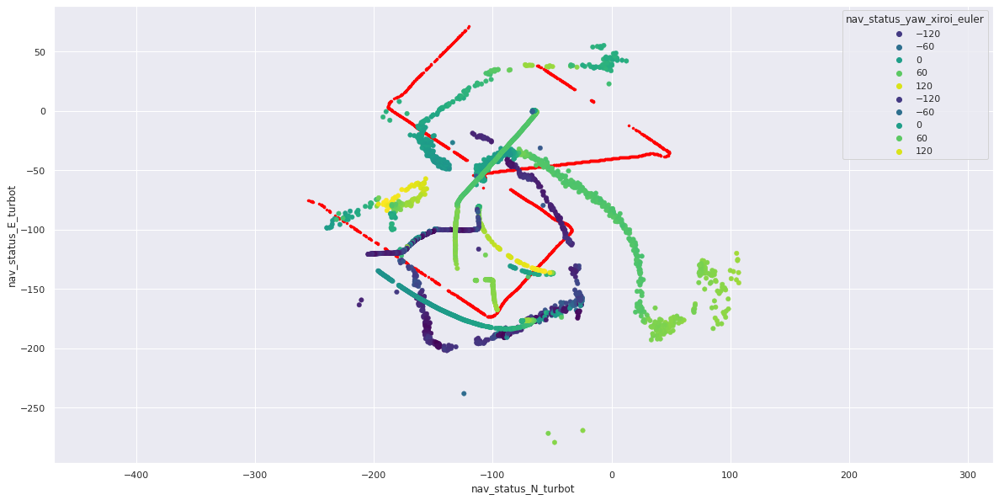

In [27]:
# Lets plot again the localization results, this time color represents the xiroi orientation
sns.set(rc={'figure.figsize':(20,10)})
fig, ax = plt.subplots()
sns.scatterplot(data=nav,x="nav_status_N_turbot", y="nav_status_E_turbot", hue=None, style=None, edgecolor=None, s=10, ax=ax, color='red')
sns.scatterplot(data=nav,x="p2_N", y="p2_E", hue='nav_status_yaw_xiroi_euler', style=None, edgecolor=None, s=30, ax=ax, palette='viridis')
sns.scatterplot(data=nav,x="nav_status_N_xiroi", y="nav_status_E_xiroi", hue='nav_status_yaw_xiroi_euler', style=None, edgecolor=None, s=30, ax=ax, palette='viridis')
plt.axis('equal')
plt.show()

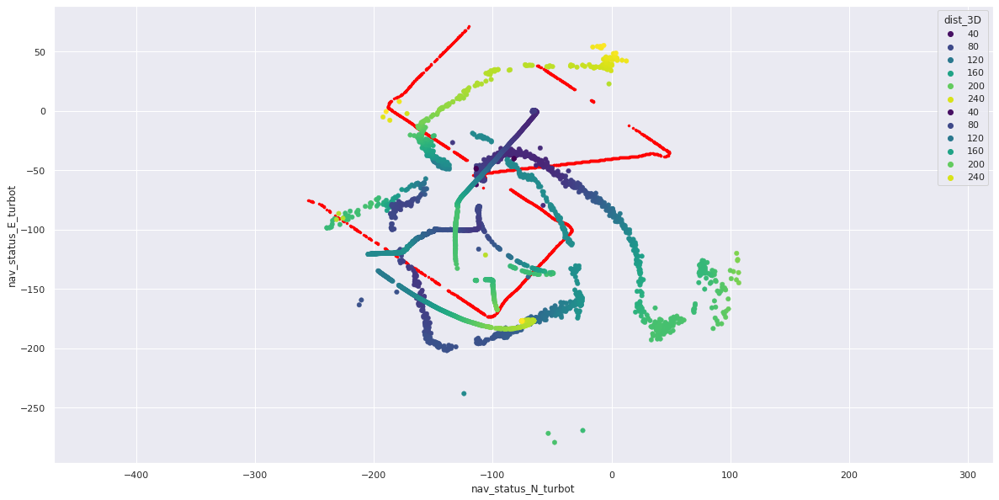

In [28]:
# Lets plot again the localization results, this time color represents the distance
sns.set(rc={'figure.figsize':(20,10)})
nav['nav_status_yaw_xiroi_euler'] = nav['nav_status_yaw_xiroi'] *180/np.pi 
fig, ax = plt.subplots()
sns.scatterplot(data=nav,x="nav_status_N_turbot", y="nav_status_E_turbot", hue=None, style=None, edgecolor=None, s=10, ax=ax, color='red')
sns.scatterplot(data=nav,x="p2_N", y="p2_E", hue='dist_3D', style=None, edgecolor=None, s=30, ax=ax, palette='viridis')
sns.scatterplot(data=nav,x="nav_status_N_xiroi", y="nav_status_E_xiroi", hue='dist_3D', style=None, edgecolor=None, s=30, ax=ax, palette='viridis')
plt.axis('equal')
plt.show()

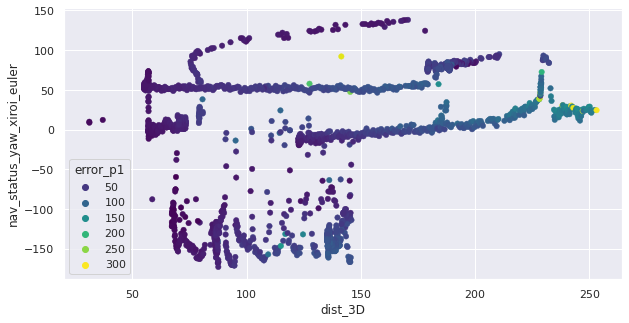

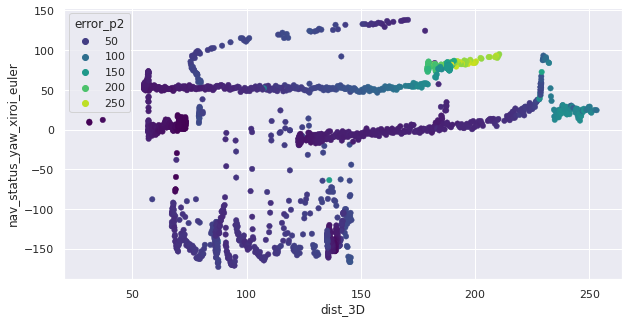

In [29]:
sns.set(rc={'figure.figsize':(10,5)})
fig, ax = plt.subplots()
sns.scatterplot(data=nav,x="dist_3D", y="nav_status_yaw_xiroi_euler", hue='error_p1', style=None, edgecolor=None, s=30, ax=ax, palette='viridis')
plt.show()
sns.set(rc={'figure.figsize':(10,5)})
fig, ax = plt.subplots()
sns.scatterplot(data=nav,x="dist_3D", y="nav_status_yaw_xiroi_euler", hue='error_p2', style=None, edgecolor=None, s=30, ax=ax, palette='viridis')
plt.show()

In [30]:
# Check correlation with setpoints or speeds
# There is a clear correlation with the orientation. However it is not conclusive, we should check the correlation with setpoints or speeds. And check that in other datasets we find the same behavior.
# In case that we confirm this correlation find the cause
# Extract the RSSI values too